# 开放场景：欧氏距离势函数

实验场景：`pbrs-r1.0`。

代码及已有输出摘自 `PBRS重跑1.ipynb` 的第 2 个单元格（按全部单元格计数，从 1 开始）。此副本仅整理注释与排版，保留原单元格的执行编号及全部输出；警告消息中的个人目录路径已匿名化。以下日志、曲线和动画是原 notebook 保存的历史输出，本次整理未重新训练。

运行时请将工作目录设为仓库根目录，并使用原实验的依赖环境。脚本版见 `experiments/03_open_pbrs_euclidean.py`。


<HOME>/miniforge3/envs/ai_stable/lib/python3.11/site-packages/gym/envs/registration.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


开始训练...
Ep:   100 | Ind: 0.27 | Pure_Glo: 0.02 | Safe_Glo: 0.01 | Strict_Glo: 0.00 | Cols/Ep: 1.1 | Reward(list): [-599.14, -599.14, -599.14] | Jerk(list): [0.200, 11.825, 0.373]
Ep:   200 | Ind: 0.31 | Pure_Glo: 0.05 | Safe_Glo: 0.03 | Strict_Glo: 0.02 | Cols/Ep: 1.7 | Reward(list): [-521.00, -521.00, -521.00] | Jerk(list): [1.838, 10.425, 2.291]
Ep:   300 | Ind: 0.38 | Pure_Glo: 0.07 | Safe_Glo: 0.06 | Strict_Glo: 0.05 | Cols/Ep: 2.0 | Reward(list): [-519.23, -519.23, -519.23] | Jerk(list): [0.340, 12.079, 12.769]
Ep:   400 | Ind: 0.43 | Pure_Glo: 0.11 | Safe_Glo: 0.02 | Strict_Glo: 0.00 | Cols/Ep: 5.1 | Reward(list): [-442.68, -442.68, -442.68] | Jerk(list): [5.458, 7.771, 12.996]
Ep:   500 | Ind: 0.42 | Pure_Glo: 0.08 | Safe_Glo: 0.02 | Strict_Glo: 0.01 | Cols/Ep: 4.5 | Reward(list): [-416.24, -416.24, -416.24] | Jerk(list): [10.262, 8.090, 11.968]
Ep:   600 | Ind: 0.50 | Pure_Glo: 0.14 | Safe_Glo: 0.02 | Strict_Glo: 0.01 | Cols/Ep: 10.1 | Reward(list): [-407.11, -407.11, -407.11] 

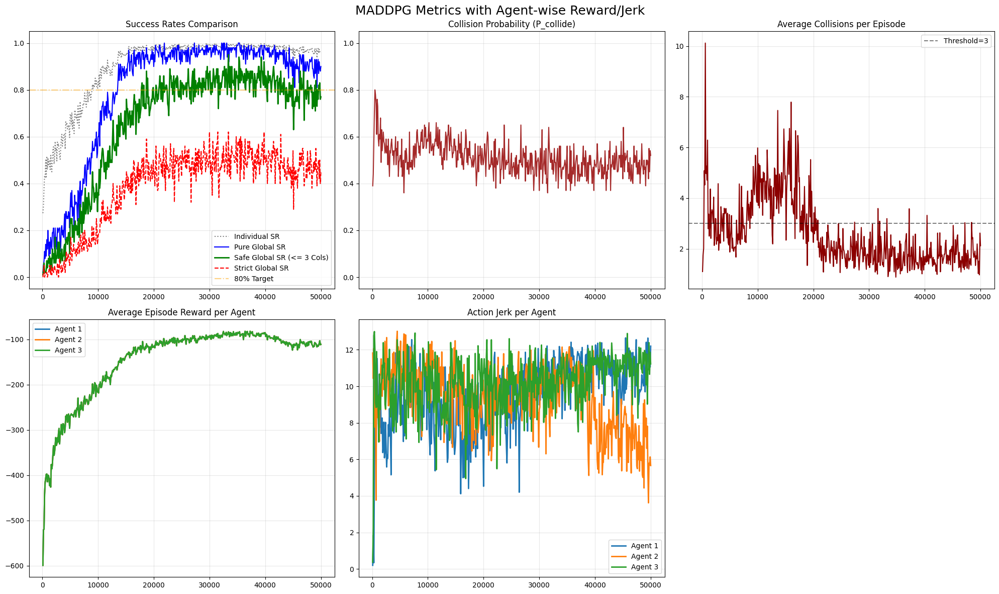


三阶段 rollout 概览:
Start  | covered_agents=0 | collisions=0 | success=False
Middle | covered_agents=3 | collisions=2 | success=True
Final  | covered_agents=3 | collisions=0 | success=True

显示三阶段策略动画...


In [1]:
import sys
import copy
import random
import collections

sys.path.append("multiagent-particle-envs")

import gym
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, patches
from IPython.display import HTML, display

import torch
import torch.nn as nn
import torch.nn.functional as F

from multiagent.environment import MultiAgentEnv
import multiagent.scenarios as scenarios


# 1. 环境与基础函数


def make_env(scenario_name):
    scenario = scenarios.load(scenario_name + ".py").Scenario()
    world = scenario.make_world()
    env = MultiAgentEnv(world, scenario.reset_world, scenario.reward, scenario.observation)
    return env


def onehot_from_logits(logits, eps=0.01):
    argmax_acs = (logits == logits.max(1, keepdim=True)[0]).float()
    rand_idx = np.random.choice(range(logits.shape[1]), size=logits.shape[0])
    rand_acs = torch.eye(logits.shape[1], device=logits.device)[torch.tensor(rand_idx, device=logits.device)]
    chooser = torch.rand(logits.shape[0], device=logits.device)
    return torch.stack([
        argmax_acs[i] if chooser[i] > eps else rand_acs[i]
        for i in range(logits.shape[0])
    ])


def sample_gumbel(shape, eps=1e-20, device="cpu"):
    U = torch.rand(shape, device=device)
    return -torch.log(-torch.log(U + eps) + eps)


def gumbel_softmax_sample(logits, temperature):
    y = logits + sample_gumbel(logits.shape, device=logits.device)
    return F.softmax(y / temperature, dim=1)


def gumbel_softmax(logits, temperature=1.0):
    y = gumbel_softmax_sample(logits, temperature)
    y_hard = onehot_from_logits(y)
    return (y_hard - y).detach() + y


def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


# 2. 网络与 MADDPG


class TwoLayerFC(nn.Module):
    def __init__(self, num_in, num_out, hidden_dim):
        super().__init__()
        self.fc1 = nn.Linear(num_in, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, num_out)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return self.fc3(x)


class DDPG:
    def __init__(self, state_dim, action_dim, critic_input_dim, hidden_dim, actor_lr, critic_lr, device):
        self.actor = TwoLayerFC(state_dim, action_dim, hidden_dim).to(device)
        self.target_actor = TwoLayerFC(state_dim, action_dim, hidden_dim).to(device)
        self.critic = TwoLayerFC(critic_input_dim, 1, hidden_dim).to(device)
        self.target_critic = TwoLayerFC(critic_input_dim, 1, hidden_dim).to(device)

        self.target_actor.load_state_dict(self.actor.state_dict())
        self.target_critic.load_state_dict(self.critic.state_dict())

        self.actor_optimizer = torch.optim.Adam(self.actor.parameters(), lr=actor_lr)
        self.critic_optimizer = torch.optim.Adam(self.critic.parameters(), lr=critic_lr)
        self.device = device

    def take_action(self, state, explore=False):
        state = torch.tensor(state, dtype=torch.float32, device=self.device).unsqueeze(0)
        action_logits = self.actor(state)
        if explore:
            action = gumbel_softmax(action_logits)
        else:
            action = onehot_from_logits(action_logits)
        return action.squeeze(0).detach().cpu().numpy()

    def soft_update(self, net, target_net, tau):
        for param_target, param in zip(target_net.parameters(), net.parameters()):
            param_target.data.copy_(param_target.data * (1.0 - tau) + param.data * tau)


class MADDPG:
    def __init__(self, env, device, actor_lr, critic_lr, hidden_dim,
                 state_dims, action_dims, critic_input_dim, gamma, tau):
        self.agents = []
        for i in range(len(env.agents)):
            self.agents.append(
                DDPG(state_dims[i], action_dims[i], critic_input_dim,
                     hidden_dim, actor_lr, critic_lr, device)
            )
        self.gamma = gamma
        self.tau = tau
        self.critic_criterion = nn.MSELoss()
        self.device = device

    @property
    def policies(self):
        return [agent.actor for agent in self.agents]

    @property
    def target_policies(self):
        return [agent.target_actor for agent in self.agents]

    def take_action(self, states, explore):
        return [agent.take_action(state, explore) for agent, state in zip(self.agents, states)]

    def update(self, sample, i_agent):
        obs, act, rew, next_obs, done = sample
        cur_agent = self.agents[i_agent]

        cur_agent.critic_optimizer.zero_grad()
        all_target_act = [
            onehot_from_logits(pi(_next_obs))
            for pi, _next_obs in zip(self.target_policies, next_obs)
        ]
        target_critic_input = torch.cat((*next_obs, *all_target_act), dim=1)
        target_q = rew[i_agent].view(-1, 1) + self.gamma * cur_agent.target_critic(target_critic_input) * (1 - done[i_agent].view(-1, 1))

        critic_input = torch.cat((*obs, *act), dim=1)
        critic_q = cur_agent.critic(critic_input)
        critic_loss = self.critic_criterion(critic_q, target_q.detach())
        critic_loss.backward()
        cur_agent.critic_optimizer.step()

        cur_agent.actor_optimizer.zero_grad()
        cur_actor_out = cur_agent.actor(obs[i_agent])
        cur_act_vf_in = gumbel_softmax(cur_actor_out)

        all_actor_acs = []
        for idx, (pi, _obs) in enumerate(zip(self.policies, obs)):
            if idx == i_agent:
                all_actor_acs.append(cur_act_vf_in)
            else:
                all_actor_acs.append(onehot_from_logits(pi(_obs)))

        vf_in = torch.cat((*obs, *all_actor_acs), dim=1)
        actor_loss = -cur_agent.critic(vf_in).mean()
        actor_loss += (cur_actor_out ** 2).mean() * 1e-3
        actor_loss.backward()
        cur_agent.actor_optimizer.step()

    def update_all_targets(self):
        for agent in self.agents:
            agent.soft_update(agent.actor, agent.target_actor, self.tau)
            agent.soft_update(agent.critic, agent.target_critic, self.tau)


class MultiAgentReplayBuffer:
    def __init__(self, capacity):
        self.buffer = collections.deque(maxlen=capacity)

    def add(self, state, action, reward, next_state, done):
        self.buffer.append((state, action, reward, next_state, done))

    def sample(self, batch_size):
        transitions = random.sample(self.buffer, batch_size)
        state, action, reward, next_state, done = zip(*transitions)
        return list(state), list(action), list(reward), list(next_state), list(done)

    def size(self):
        return len(self.buffer)


# 3. 评估指标


def evaluate_ablation_metrics(env_id, maddpg, n_episode=100, episode_length=50, dt=0.1, safe_collision_threshold=3):
    env = make_env(env_id)
    K = len(env.agents)

    agent_radius = env.world.agents[0].size
    landmark_radius = env.world.landmarks[0].size
    cover_threshold = agent_radius + landmark_radius
    collide_enabled = any(getattr(a, 'collide', False) for a in env.world.agents)

    total_individual_success = 0
    strict_global_success_episodes = 0
    safe_global_success_episodes = 0
    pure_global_success_episodes = 0
    collision_episodes = 0
    total_collisions_all = 0

    total_jerk_per_agent = np.zeros(K, dtype=np.float64)
    total_reward_per_agent = np.zeros(K, dtype=np.float64)

    for _ in range(n_episode):
        obs = env.reset()
        prev_actions = None
        episode_collisions = 0
        agent_covered = [False] * K
        episode_reward_per_agent = np.zeros(K, dtype=np.float64)

        for _t in range(episode_length):
            actions = maddpg.take_action(obs, explore=False)

            if prev_actions is not None:
                for i, (a, pa) in enumerate(zip(actions, prev_actions)):
                    jerk_t = np.linalg.norm((np.asarray(a) - np.asarray(pa)) / dt)
                    total_jerk_per_agent[i] += jerk_t
            prev_actions = [np.asarray(a).copy() for a in actions]

            obs, rew, done, info = env.step(actions)
            rew_array = np.asarray(rew, dtype=np.float64)
            episode_reward_per_agent += rew_array

            if collide_enabled:
                agent_positions = [agent.state.p_pos for agent in env.world.agents]
                for i in range(K):
                    for j in range(i + 1, K):
                        dist = np.linalg.norm(agent_positions[i] - agent_positions[j])
                        if dist < (env.world.agents[i].size + env.world.agents[j].size):
                            episode_collisions += 1

            agent_positions = [agent.state.p_pos for agent in env.world.agents]
            landmark_positions = [lm.state.p_pos for lm in env.world.landmarks]
            for ai in range(K):
                if agent_covered[ai]:
                    continue
                pos = agent_positions[ai]
                for l_pos in landmark_positions:
                    if np.linalg.norm(pos - l_pos) <= cover_threshold:
                        agent_covered[ai] = True
                        break

        k_success = sum(agent_covered)
        total_individual_success += k_success

        if k_success == K:
            pure_global_success_episodes += 1
            if episode_collisions <= safe_collision_threshold:
                safe_global_success_episodes += 1
            if episode_collisions == 0:
                strict_global_success_episodes += 1

        if episode_collisions > 0:
            collision_episodes += 1

        total_collisions_all += episode_collisions
        total_reward_per_agent += episode_reward_per_agent

    sr_ind = total_individual_success / (n_episode * K)
    sr_pure_global = pure_global_success_episodes / float(n_episode)
    sr_safe_global = safe_global_success_episodes / float(n_episode)
    sr_strict_global = strict_global_success_episodes / float(n_episode)
    p_collide = collision_episodes / float(n_episode)
    avg_ep_collisions = total_collisions_all / float(n_episode)

    valid_steps = max(episode_length - 1, 1)
    avg_jerk_per_agent = (total_jerk_per_agent / (n_episode * valid_steps)).tolist()
    avg_reward_per_agent = (total_reward_per_agent / n_episode).tolist()

    return {
        'sr_ind': sr_ind,
        'sr_pure_global': sr_pure_global,
        'sr_safe_global': sr_safe_global,
        'sr_strict_global': sr_strict_global,
        'p_collide': p_collide,
        'avg_ep_collisions': avg_ep_collisions,
        'avg_jerk_per_agent': avg_jerk_per_agent,
        'avg_reward_per_agent': avg_reward_per_agent,
    }


def calculate_convergence_speed(success_list, eval_interval=100, threshold=0.80):
    if len(success_list) == 0:
        return '未收敛'
    for i, sr in enumerate(success_list):
        if sr >= threshold:
            return (i + 1) * eval_interval
    return '在当前训练回合内未达到及格线'


# 4. 策略快照与轨迹动画


def capture_policy_snapshot(maddpg):
    return [copy.deepcopy(agent.actor.state_dict()) for agent in maddpg.agents]


def load_policy_snapshot(maddpg, snapshot):
    for agent, actor_state in zip(maddpg.agents, snapshot):
        agent.actor.load_state_dict(actor_state)
        agent.target_actor.load_state_dict(actor_state)


def collect_rollout_frames(env_id, maddpg, episode_length=50):
    env = make_env(env_id)
    obs = env.reset()
    frames = []
    wall_entities = list(getattr(env.world, 'walls', []))

    for step in range(episode_length + 1):
        frames.append({
            'agents': np.array([agent.state.p_pos.copy() for agent in env.world.agents], dtype=np.float64),
            'agent_sizes': np.array([agent.size for agent in env.world.agents], dtype=np.float64),
            'landmarks': np.array([landmark.state.p_pos.copy() for landmark in env.world.landmarks], dtype=np.float64),
            'landmark_sizes': np.array([landmark.size for landmark in env.world.landmarks], dtype=np.float64),
            'walls': np.array([wall.state.p_pos.copy() for wall in wall_entities], dtype=np.float64),
            'wall_sizes': np.array([wall.size for wall in wall_entities], dtype=np.float64),
        })
        if step == episode_length:
            break
        actions = maddpg.take_action(obs, explore=False)
        obs, _, _, _ = env.step(actions)

    return frames


def summarize_rollout(frames, safe_collision_threshold=3):
    first = frames[0]
    num_agents = len(first['agents'])
    num_landmarks = len(first['landmarks'])

    if num_agents == 0 or num_landmarks == 0:
        return {
            'covered_agents': 0,
            'collision_count': 0,
            'success': False,
            'strict_success': False,
            'final_total_min_dist': np.inf,
        }

    agent_sizes = first.get('agent_sizes', np.full(num_agents, 0.15))
    landmark_sizes = first.get('landmark_sizes', np.full(num_landmarks, 0.08))
    wall_sizes = first.get('wall_sizes', np.full(len(first['walls']), 0.2))

    agent_covered = [False] * num_agents
    collision_count = 0

    for frame in frames:
        agent_pos = frame['agents']
        landmark_pos = frame['landmarks']
        wall_pos = frame['walls']

        for i in range(num_agents):
            for j in range(i + 1, num_agents):
                dist = np.linalg.norm(agent_pos[i] - agent_pos[j])
                if dist < (agent_sizes[i] + agent_sizes[j]):
                    collision_count += 1

        for i in range(num_agents):
            for wall_idx in range(len(wall_pos)):
                dist = np.linalg.norm(agent_pos[i] - wall_pos[wall_idx])
                if dist < (agent_sizes[i] + wall_sizes[wall_idx]):
                    collision_count += 1

        for i in range(num_agents):
            if agent_covered[i]:
                continue
            for j in range(num_landmarks):
                dist = np.linalg.norm(agent_pos[i] - landmark_pos[j])
                if dist <= (agent_sizes[i] + landmark_sizes[j]):
                    agent_covered[i] = True
                    break

    final_agents = frames[-1]['agents']
    final_landmarks = frames[-1]['landmarks']
    final_total_min_dist = 0.0
    for lm in final_landmarks:
        final_total_min_dist += min(np.linalg.norm(agent - lm) for agent in final_agents)

    covered_agents = sum(agent_covered)
    success = (covered_agents == num_agents) and (collision_count <= safe_collision_threshold)
    strict_success = (covered_agents == num_agents) and (collision_count == 0)

    return {
        'covered_agents': covered_agents,
        'collision_count': collision_count,
        'success': success,
        'strict_success': strict_success,
        'final_total_min_dist': final_total_min_dist,
    }


def sample_stage_rollout(env_id, maddpg, snapshot, episode_length=50, n_try=30,
                         stage='best', safe_collision_threshold=3, min_covered=0):
    load_policy_snapshot(maddpg, snapshot)
    candidates = []

    for _ in range(n_try):
        frames = collect_rollout_frames(env_id, maddpg, episode_length=episode_length)
        summary = summarize_rollout(frames, safe_collision_threshold=safe_collision_threshold)
        if summary['covered_agents'] >= min_covered:
            candidates.append((frames, summary))

    if not candidates:
        frames = collect_rollout_frames(env_id, maddpg, episode_length=episode_length)
        summary = summarize_rollout(frames, safe_collision_threshold=safe_collision_threshold)
        return frames, summary

    if stage == 'start_poor':
        candidates.sort(key=lambda x: (x[1]['covered_agents'], x[1]['collision_count'], x[1]['final_total_min_dist']))
        return candidates[0]

    if stage == 'mid_partial':
        partial = [c for c in candidates if c[1]['covered_agents'] >= min_covered]
        if partial:
            partial.sort(key=lambda x: (x[1]['covered_agents'], -x[1]['collision_count'], -x[1]['final_total_min_dist']), reverse=True)
            return partial[0]
        candidates.sort(key=lambda x: (x[1]['covered_agents'], -x[1]['collision_count'], -x[1]['final_total_min_dist']), reverse=True)
        return candidates[0]

    if stage == 'final_success':
        success_candidates = [c for c in candidates if c[1]['success']]
        if success_candidates:
            success_candidates.sort(key=lambda x: (x[1]['covered_agents'], -x[1]['collision_count'], -x[1]['final_total_min_dist']), reverse=True)
            return success_candidates[0]
        candidates.sort(key=lambda x: (x[1]['covered_agents'], -x[1]['collision_count'], -x[1]['final_total_min_dist']), reverse=True)
        return candidates[0]

    candidates.sort(key=lambda x: (x[1]['covered_agents'], -x[1]['collision_count'], -x[1]['final_total_min_dist']), reverse=True)
    return candidates[0]


def render_rollout_animation(frames, title='Policy Rollout', interval=250):
    agent_colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple']
    first_frame = frames[0]
    num_agents = len(first_frame['agents'])

    all_points = []
    max_radius = 0.0
    for frame in frames:
        if len(frame['agents']) > 0:
            all_points.append(frame['agents'])
            max_radius = max(max_radius, float(np.max(frame.get('agent_sizes', np.full(len(frame['agents']), 0.15)))))
        if len(frame['landmarks']) > 0:
            all_points.append(frame['landmarks'])
            max_radius = max(max_radius, float(np.max(frame.get('landmark_sizes', np.full(len(frame['landmarks']), 0.08)))))
        if len(frame['walls']) > 0:
            all_points.append(frame['walls'])
            max_radius = max(max_radius, float(np.max(frame.get('wall_sizes', np.full(len(frame['walls']), 0.2)))))
    all_points = np.vstack(all_points)

    pad = max(0.3, max_radius + 0.15)
    x_min, y_min = np.min(all_points, axis=0) - pad
    x_max, y_max = np.max(all_points, axis=0) + pad

    fig, ax = plt.subplots(figsize=(6.5, 6.5))
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_aspect('equal')
    ax.grid(True, alpha=0.2)
    ax.set_title(title)

    static_artists = []

    if len(first_frame['landmarks']) > 0:
        landmark_scatter = ax.scatter(
            first_frame['landmarks'][:, 0],
            first_frame['landmarks'][:, 1],
            marker='*',
            s=260,
            c='gold',
            edgecolors='black',
            linewidths=1.0,
            zorder=3,
            label='Landmarks'
        )
        static_artists.append(landmark_scatter)

    wall_sizes = first_frame.get('wall_sizes', np.full(len(first_frame['walls']), 0.2))
    wall_patches = []
    if len(first_frame['walls']) > 0:
        for idx, (wall_pos, wall_size) in enumerate(zip(first_frame['walls'], wall_sizes)):
            wall_patch = patches.Circle(
                (wall_pos[0], wall_pos[1]),
                radius=float(wall_size),
                facecolor='dimgray',
                edgecolor='black',
                linewidth=1.2,
                alpha=0.65,
                zorder=2,
                label='Walls' if idx == 0 else '_nolegend_',
            )
            ax.add_patch(wall_patch)
            wall_patches.append(wall_patch)
    static_artists.extend(wall_patches)

    def segment_hits_wall(p0, p1):
        if len(first_frame['walls']) == 0:
            return False
        seg = p1 - p0
        seg_len_sq = np.dot(seg, seg)
        for wall_pos, wall_size in zip(first_frame['walls'], wall_sizes):
            if seg_len_sq < 1e-12:
                dist = np.linalg.norm(p0 - wall_pos)
            else:
                t = np.dot(wall_pos - p0, seg) / seg_len_sq
                t = np.clip(t, 0.0, 1.0)
                projection = p0 + t * seg
                dist = np.linalg.norm(projection - wall_pos)
            if dist < float(wall_size):
                return True
        return False

    agent_scatters = []
    trail_lines = []
    agent_labels = []
    for i in range(num_agents):
        scatter = ax.scatter([], [], s=140, c=agent_colors[i % len(agent_colors)], zorder=4, label=f'Agent {i + 1}')
        trail_line, = ax.plot([], [], color=agent_colors[i % len(agent_colors)], linewidth=1.5, alpha=0.6, zorder=1)
        label = ax.text(0.0, 0.0, '', fontsize=10, weight='bold', zorder=5)
        agent_scatters.append(scatter)
        trail_lines.append(trail_line)
        agent_labels.append(label)

    ax.legend(loc='upper right')

    def init():
        for scatter, line, label in zip(agent_scatters, trail_lines, agent_labels):
            scatter.set_offsets(np.empty((0, 2)))
            line.set_data([], [])
            label.set_text('')
        return static_artists + agent_scatters + trail_lines + agent_labels

    def update(frame_idx):
        frame = frames[frame_idx]
        for i, (scatter, line, label) in enumerate(zip(agent_scatters, trail_lines, agent_labels)):
            pos = frame['agents'][i]
            scatter.set_offsets(pos.reshape(1, 2))
            history = np.array([f['agents'][i] for f in frames[:frame_idx + 1]])

            if len(history) <= 1:
                line.set_data(history[:, 0], history[:, 1])
            else:
                trail_x = [history[0, 0]]
                trail_y = [history[0, 1]]
                for prev_pos, curr_pos in zip(history[:-1], history[1:]):
                    if segment_hits_wall(prev_pos, curr_pos):
                        trail_x.extend([np.nan, curr_pos[0]])
                        trail_y.extend([np.nan, curr_pos[1]])
                    else:
                        trail_x.append(curr_pos[0])
                        trail_y.append(curr_pos[1])
                line.set_data(trail_x, trail_y)

            label.set_position((pos[0] + 0.03, pos[1] + 0.03))
            label.set_text(f'A{i + 1}')

        ax.set_xlabel(f'Step: {frame_idx}/{len(frames) - 1}')
        return static_artists + agent_scatters + trail_lines + agent_labels

    anim = animation.FuncAnimation(
        fig,
        update,
        init_func=init,
        frames=len(frames),
        interval=interval,
        blit=False,
    )
    plt.close(fig)
    return HTML(anim.to_jshtml())


# 5. 训练配置


seed = 42
set_seed(seed)

num_episodes = 50000
episode_length = 100
buffer_size = 100000
hidden_dim = 64
actor_lr = 1e-2
critic_lr = 1e-2
gamma = 0.95
tau = 1e-2
batch_size = 1024
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
update_interval = 100
minimal_size = 4000
eval_interval = 100
safe_collision_threshold = 3

env_id = 'pbrs-r1.0'   # 本实验使用的场景
env = make_env(env_id)
for a in env.world.agents:
    a.collide = True

replay_buffer = MultiAgentReplayBuffer(buffer_size)
state_dims = [space.shape[0] for space in env.observation_space]
action_dims = [space.n for space in env.action_space]
critic_input_dim = sum(state_dims) + sum(action_dims)
num_agents = len(env.agents)

maddpg = MADDPG(
    env,
    device,
    actor_lr,
    critic_lr,
    hidden_dim,
    state_dims,
    action_dims,
    critic_input_dim,
    gamma,
    tau,
)

metrics_history = {
    'sr_ind': [],
    'sr_pure_global': [],
    'sr_safe_global': [],
    'sr_strict_global': [],
    'p_collide': [],
    'avg_ep_collisions': [],
    'avg_jerk_per_agent': [],
    'avg_reward_per_agent': [],
}

def stack_array(x, device):
    if len(x) == 0:
        return []
    if isinstance(x[0], list):
        rearranged = [[sub_x[i] for sub_x in x] for i in range(len(x[0]))]
    else:
        rearranged = [x]

    result = []
    for aa in rearranged:
        try:
            arr = np.vstack(aa)
        except Exception:
            arr = np.array(aa, dtype=np.float32)
        result.append(torch.tensor(arr, dtype=torch.float32, device=device))
    return result


# 初始、中期和末期策略快照
start_snapshot = capture_policy_snapshot(maddpg)
mid_snapshot = None
partial_snapshot = None
best_success_snapshot = capture_policy_snapshot(maddpg)
best_success_score = -np.inf
best_success_ind_score = -np.inf


total_step = 0
print('开始训练...')
for i_episode in range(num_episodes):
    state = env.reset()

    for _ in range(episode_length):
        actions = maddpg.take_action(state, explore=True)
        next_state, reward, done, _ = env.step(actions)
        replay_buffer.add(state, actions, reward, next_state, done)
        state = next_state
        total_step += 1

    if replay_buffer.size() >= minimal_size and total_step % update_interval == 0:
        sample = replay_buffer.sample(batch_size)
        sample = [stack_array(x, device) for x in sample]
        for a_i in range(num_agents):
            maddpg.update(sample, a_i)
        maddpg.update_all_targets()

    if mid_snapshot is None and (i_episode + 1) >= (num_episodes // 2):
        mid_snapshot = capture_policy_snapshot(maddpg)

    if (i_episode + 1) % eval_interval == 0:
        eval_metrics = evaluate_ablation_metrics(
            env_id,
            maddpg,
            n_episode=100,
            episode_length=episode_length,
            safe_collision_threshold=safe_collision_threshold,
        )

        for key in metrics_history:
            metrics_history[key].append(eval_metrics[key])

        if partial_snapshot is None and eval_metrics['sr_ind'] >= 0.34:
            partial_snapshot = capture_policy_snapshot(maddpg)

        if (
            eval_metrics['sr_safe_global'] > best_success_score
            or (
                eval_metrics['sr_safe_global'] == best_success_score
                and eval_metrics['sr_ind'] > best_success_ind_score
            )
        ):
            best_success_snapshot = capture_policy_snapshot(maddpg)
            best_success_score = eval_metrics['sr_safe_global']
            best_success_ind_score = eval_metrics['sr_ind']

        reward_str = ', '.join(f'{x:.2f}' for x in eval_metrics['avg_reward_per_agent'])
        jerk_str = ', '.join(f'{x:.3f}' for x in eval_metrics['avg_jerk_per_agent'])
        print(
            f"Ep: {i_episode + 1:5d} | "
            f"Ind: {eval_metrics['sr_ind']:.2f} | "
            f"Pure_Glo: {eval_metrics['sr_pure_global']:.2f} | "
            f"Safe_Glo: {eval_metrics['sr_safe_global']:.2f} | "
            f"Strict_Glo: {eval_metrics['sr_strict_global']:.2f} | "
            f"Cols/Ep: {eval_metrics['avg_ep_collisions']:.1f} | "
            f"Reward(list): [{reward_str}] | "
            f"Jerk(list): [{jerk_str}]"
        )


final_snapshot = capture_policy_snapshot(maddpg)
if mid_snapshot is None:
    mid_snapshot = final_snapshot
if partial_snapshot is None:
    partial_snapshot = mid_snapshot


# 6. 指标可视化


if metrics_history['sr_ind']:
    episodes_x = np.arange(1, len(metrics_history['sr_ind']) + 1) * eval_interval
    safe_global_sr_list = np.asarray(metrics_history['sr_safe_global'], dtype=np.float64)
    reward_array = np.asarray(metrics_history['avg_reward_per_agent'], dtype=np.float64)
    jerk_array = np.asarray(metrics_history['avg_jerk_per_agent'], dtype=np.float64)

    t_conv = calculate_convergence_speed(safe_global_sr_list, eval_interval=eval_interval, threshold=0.80)
    print(f'\n★ 任务收敛速度 (基于安全全局成功率 >= 80%) : {t_conv} Episodes')

    fig, axs = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle('MADDPG Metrics with Agent-wise Reward/Jerk', fontsize=18)

    axs[0, 0].plot(episodes_x, metrics_history['sr_ind'], color='gray', linestyle=':', label='Individual SR')
    axs[0, 0].plot(episodes_x, metrics_history['sr_pure_global'], color='blue', label='Pure Global SR')
    axs[0, 0].plot(
        episodes_x,
        metrics_history['sr_safe_global'],
        color='green',
        linewidth=2,
        label=f'Safe Global SR (<= {safe_collision_threshold} Cols)'
    )
    axs[0, 0].plot(episodes_x, metrics_history['sr_strict_global'], color='red', linestyle='--', label='Strict Global SR')
    axs[0, 0].set_title('Success Rates Comparison')
    axs[0, 0].set_ylim([-0.05, 1.05])
    axs[0, 0].axhline(y=0.80, color='orange', linestyle='-.', alpha=0.5, label='80% Target')
    axs[0, 0].legend()
    axs[0, 0].grid(True, alpha=0.3)

    axs[0, 1].plot(episodes_x, metrics_history['p_collide'], color='brown')
    axs[0, 1].set_title('Collision Probability (P_collide)')
    axs[0, 1].set_ylim([-0.05, 1.05])
    axs[0, 1].grid(True, alpha=0.3)

    axs[0, 2].plot(episodes_x, metrics_history['avg_ep_collisions'], color='darkred')
    axs[0, 2].set_title('Average Collisions per Episode')
    axs[0, 2].axhline(
        y=safe_collision_threshold,
        color='black',
        linestyle='--',
        alpha=0.5,
        label=f'Threshold={safe_collision_threshold}'
    )
    axs[0, 2].legend()
    axs[0, 2].grid(True, alpha=0.3)

    colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple']
    for i in range(num_agents):
        axs[1, 0].plot(episodes_x, reward_array[:, i], color=colors[i % len(colors)], linewidth=2, label=f'Agent {i + 1}')
    axs[1, 0].set_title('Average Episode Reward per Agent')
    axs[1, 0].legend()
    axs[1, 0].grid(True, alpha=0.3)

    for i in range(num_agents):
        axs[1, 1].plot(episodes_x, jerk_array[:, i], color=colors[i % len(colors)], linewidth=2, label=f'Agent {i + 1}')
    axs[1, 1].set_title('Action Jerk per Agent')
    axs[1, 1].legend()
    axs[1, 1].grid(True, alpha=0.3)

    fig.delaxes(axs[1, 2])
    plt.tight_layout()
    plt.show()


# 7. 三阶段策略动画


start_frames, start_summary = sample_stage_rollout(
    env_id,
    maddpg,
    start_snapshot,
    episode_length=episode_length,
    n_try=10,
    stage='start_poor',
    safe_collision_threshold=safe_collision_threshold,
)

mid_frames, mid_summary = sample_stage_rollout(
    env_id,
    maddpg,
    partial_snapshot,
    episode_length=episode_length,
    n_try=30,
    stage='mid_partial',
    safe_collision_threshold=safe_collision_threshold,
    min_covered=1,
)

final_frames, final_summary = sample_stage_rollout(
    env_id,
    maddpg,
    best_success_snapshot,
    episode_length=episode_length,
    n_try=60,
    stage='final_success',
    safe_collision_threshold=safe_collision_threshold,
    min_covered=num_agents,
)

load_policy_snapshot(maddpg, final_snapshot)

print('\n三阶段 rollout 概览:')
print(f"Start  | covered_agents={start_summary['covered_agents']} | collisions={start_summary['collision_count']} | success={start_summary['success']}")
print(f"Middle | covered_agents={mid_summary['covered_agents']} | collisions={mid_summary['collision_count']} | success={mid_summary['success']}")
print(f"Final  | covered_agents={final_summary['covered_agents']} | collisions={final_summary['collision_count']} | success={final_summary['success']}")

print('\n显示三阶段策略动画...')
display(render_rollout_animation(start_frames, title=f'{env_id} | Start Policy'))
display(render_rollout_animation(mid_frames, title=f'{env_id} | Middle Policy'))
display(render_rollout_animation(final_frames, title=f'{env_id} | Final Successful Policy'))
